# Aim of the notebook
This notebook is used to process the segmented cells and identify populations. Subclustering of serveral cell classes is requried for this

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scanpy as sc

In [ ]:
# Read the object

In [ ]:
adata=sc.read('F:/ISS/adata_baysor/adata_16samples_clustered_log_annotated_all_curated.h5ad')

In [5]:
adata=adata[~adata.obs['region'].isin(['TLN'])]

In [6]:
adata=sc.AnnData(adata.raw.X,var=adata.raw.var,obs=adata.obs)

/home/sergioms/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [7]:
adata.raw=adata
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

In [ ]:
adata2=adata
sc.pp.filter_cells(adata2,min_genes=3)
adata3=adata2

In [ ]:
# We exclude this 2 genes from clustering since they were very highly expressed and difficult the identification of popuatlons
exclude=['GPX3','A2M']
adata3=adata3[:,~adata3.var.index.isin(exclude)]

In [15]:
sc.pp.neighbors(adata3,n_neighbors=10,n_pcs=0)#,use_rep='X')
#sc.tl.umap(adata2,min_dist=0.001)#0.001)

/home/sergioms/.local/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2022-12-02 09:02:39.734922: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-12-02 09:02:40.758615: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-12-02 09:02:40.758661: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-12-02 09:0

In [ ]:
sc.tl.umap(adata3,min_dist=0.05)
sc.tl.leiden(adata3,key_added='leiden')

In [ ]:
sc.set_figure_params(scanpy=True, dpi=150, dpi_save=150, frameon=True, vector_friendly=True, fontsize=14, figsize=(10,10), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
sc.pl.umap(adata3,color='leiden',s=10)#,legend_loc='on data',legend_fontsize=7)

In [ ]:
import seaborn as sns
tot=pd.crosstab(adata3.obs['leiden'],adata3.obs['celltype_annotated'])
tott=tot.div(tot.sum(axis=1),axis=0)
sns.clustermap(tott)

In [ ]:
sc.pl.umap(adata3,color=['FN1',''],s=10,palette='tab20b',legend_loc='on data')#,legend_loc='on data')

In [ ]:
sc.pl.umap(adata3,color=['leiden'],s=10,palette='tab20b',legend_loc='on data')#,legend_loc='on data')

In [ ]:
sc.pp.log1p(adata3)

In [ ]:
sc.tl.rank_genes_groups(adata3, groupby='leiden', method='wilcoxon')
sc.pl.rank_genes_groups_dotplot(adata3, n_genes=2, swap_axes=True,save='deg.pdf')
sc.pl.rank_genes_groups(adata3, n_genes=5, swap_axes=True,fontsize=35)

In [26]:
dic=pd.read_csv("/mnt/e/ISS/annotations_dicts/annotations_num_to_celltype_notln.csv",sep=';',encoding='latin-1')
dd=dict(zip(dic['number'],dic['annotation']))
adata3.obs['celltype_annotated']=adata3.obs['leiden'].astype(int).map(dd)

In [27]:
adata3.write('/mnt/e/ISS/adata_baysor/adata_16samples_clustered_log_annotated_curated_notln.h5ad')

In [2]:
adata3=sc.read('/mnt/f/ISS/adata_baysor/adata_16samples_clustered_log_annotated_curated_notln.h5ad')

/home/sergioms/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


# Subanalysis of epithelial

In [3]:
adataepi=adata3[adata3.obs['celltype_annotated'].isin(['Epithelial'])]
adataepi=sc.AnnData(adataepi.raw.X,obs=adataepi.obs,var=adataepi.raw.var)
gn=['DDIT4','RHOB','S100A11','PRR4','SLPI','CD74','BPIFB1']
#gn=['']
adataepi.raw=adataepi
adataepi=adataepi[:,~adataepi.var.index.isin(gn)]
sc.pp.filter_cells(adataepi,min_genes=3)
#sc.pp.scale(adataepi)
sc.pp.normalize_total(adataepi)
sc.pp.log1p(adataepi)
sc.pp.neighbors(adataepi,n_neighbors=5,n_pcs=0)#,use_rep='X')
sc.tl.umap(adataepi,min_dist=0.0025)#0.001)

/home/sergioms/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/sergioms/.local/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:140: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_genes'] = number
/home/sergioms/.local/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/sergioms/.local/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython

In [4]:
sc.tl.leiden(adataepi,resolution=1.2,key_added='leiden_epi')

In [ ]:
sc.pl.umap(adataepi,color=['leiden_epi'],s=40,legend_loc='on data')

In [ ]:
sc.pl.umap(adataepi,color=['leiden_epi'],s=40,legend_loc='on data')

In [ ]:
sc.pl.umap(adataepi,color=['region','sample'],s=40,vmax=5)

In [ ]:
sc.set_figure_params(figsize=(6,6),dpi=50)
sc.pl.umap(adataepi,color=adataepi.var.index,s=3,vmax=5,ncols=4)

In [ ]:
sc.pl.umap(adataepi,color=['SLPI','AGR2','BPIFB1','SFTPB','RNASE1','MGP','KRT5','SFTPA1','CAPS','SERPINB3','S100A2','CDC20B','KRT15','MUC5AC','SCGB1A1','MUC5B','ACTA2','MYL9','FHOD3'],s=40,vmax=3)

In [ ]:
sc.tl.rank_genes_groups(adataepi, groupby='leiden_epi', method='wilcoxon')
sc.pl.rank_genes_groups(adataepi, n_genes=5, swap_axes=True,fontsize=35)

In [41]:
adataepi.obs['X']=adataepi.obs['x']
adataepi.obs['Y']=adataepi.obs['y']
for a in adataepi.obs['sample'].unique():
    ads=adataepi[adataepi.obs['sample']==a]
#    sc.pl.umap(ads,color=['annotation_2'],cmap='hsv',s=30)#,'total_counts'])#,save='chickbrain_UMAP_bins.pdf')
    map_of_clusters(ads,key='leiden_epi',figuresize=(8,8),size=5,clusters=[8])

NameError: name 'map_of_clusters' is not defined

In [7]:
dic=pd.read_csv("/mnt/f/ISS/annotations_dicts/Epithelial annotations levels.csv",sep=';',encoding='latin-1')
dd=dict(zip(dic['Cluster'],dic['Final-Level3']))
adataepi.obs['celltype_annotated']=adataepi.obs['leiden_epi'].astype(int).map(dd)

In [9]:
dic=pd.read_csv("/mnt/f/ISS/annotations_dicts/Epithelial annotations levels.csv",sep=';',encoding='latin-1')
dd2=dict(zip(dic['Cluster'],dic['Collapsed-level3']))
adataepi.obs['collapsed_epi']=adataepi.obs['leiden_epi'].astype(int).map(dd2)

In [21]:
adataepi.obs['collapsed_epi']=adataepi.obs['collapsed_epi'].astype(str)
adataepi.obs.loc[adataepi.obs['collapsed_epi']=='Doublets','collapsed_epi']='Nan/Doublets'
adataepi.obs.loc[adataepi.obs['collapsed_epi']=='Nan','collapsed_epi']='Nan/Doublets'

In [45]:
adataepi.uns['collapsed_epi_colors']=[
    "#FF5733",  # Reddish Orange
    "#3498DB",  # Blue
    "#2ECC71",  # Green
    "#F1C40F",  # Yellow
    "#FFC0CB",  # Pink
    "#c1cdcd",
    "#E67E22",  # Orange
    "#9B59B6",  # Purple
    "#34495E",  # Dark Blue Gray
    "#1ABC9C",  # Turquoise
    "#48ba00",  # Red
    "#E135DC",  # Pumpkin
    "#8E44AD",  # Dark Purple
    "#27AE60"   # Emerald Green
    
]

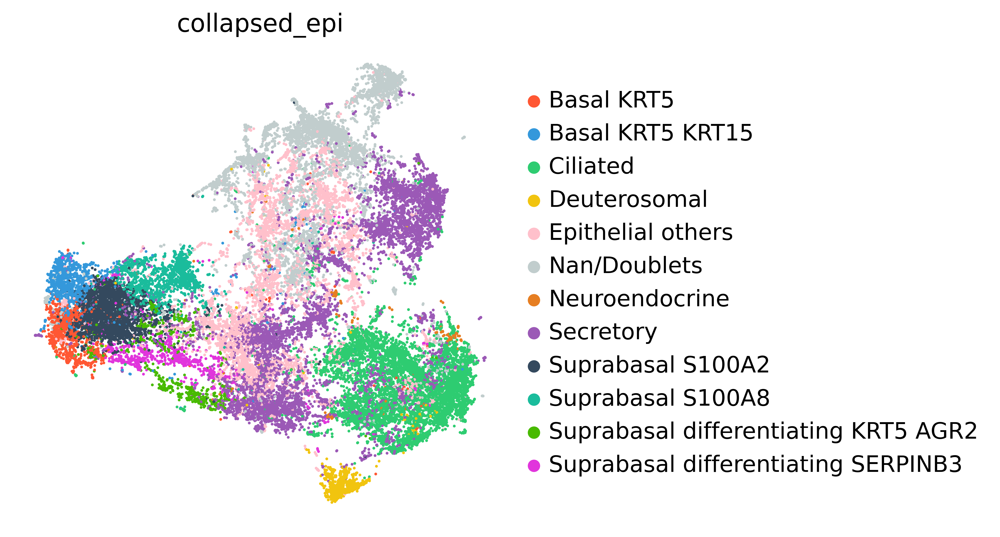

In [47]:
sc.settings.set_figure_params(transparent=True)
sc.set_figure_params(figsize=(5,5),dpi=300)
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sc.pl.umap(adataepi,color=['collapsed_epi'],s=10,frameon=False,save='epithelial_collapsed_for_plot.pdf')

In [8]:
epidict=dict(zip(adataepi.obs.index,adataepi.obs['celltype_annotated']))
adata3.obs['celltype_annotated_epi']=adata3.obs.index.astype(str).map(epidict)
adataepi.obs['celltype_annotated_epi']=adataepi.obs.index.map(epidict)

In [ ]:
sc.pl.umap(adata3,color=['celltype_annotated_epi'])

In [49]:
GN=['SERPINB3','S100A8','SPRR1B','SPRR3','AGR2','S100A2','KRT5','KRT15']

In [ ]:
for g in GN:
    plt.rcParams['figure.facecolor'] = 'white'
    sc.set_figure_params(figsize=(3,3),dpi=100)
    import matplotlib
    matplotlib.rcParams['pdf.fonttype'] = 42
    matplotlib.rcParams['ps.fonttype'] = 42
    sc.pl.umap(adataepi,color=g,size=10,frameon=False,save='epithelial_subclusters_'+g+'_size20.pdf',vmax='p99')#

In [ ]:
plt.rcParams['figure.facecolor'] = 'white'
sc.set_figure_params(figsize=(10,10),dpi=100)
sc.pl.umap(adataepi,color='sample',size=15,legend_fontsize=8,save='epithelial_subclusters_sample_size10.pdf')#

In [ ]:
plt.rcParams['figure.facecolor'] = 'white'
sc.set_figure_params(figsize=(10,10),dpi=100)
sc.pl.umap(adataepi,color='celltype_annotated',size=6,legend_fontsize=8,save='epithelial_subclusters_UMAP_legend_outside_size6.pdf')#

# Subanalysis of endo/fibro

In [23]:
selected=[
 'Endothelial_mixed',
 'Endo_vascular_cap?',
 'Fibro_or_vasc.',
 'Endo venous',
 'Merged_fibro_vasc','SMC']
adataendo=adata3[adata3.obs['celltype_annotated'].isin(selected)]

In [24]:
gns=['TIMP1','MGP','RHOB','GPX3','S100A4','EGR1','CST3','LYZ','ADIRF','DDIT4','BPIFB1']
adataendo=adataendo[:,adataendo.var.index[~adataendo.var.index.isin(gns)]]
sc.pp.filter_cells(adataepi,min_genes=3)
#sc.pp.normalize_total(adataendo)
#sc.pp.log1p(adataendo)

/home/sergioms/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [25]:
sc.pp.filter_cells(adataendo,min_genes=2)

/home/sergioms/.local/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:140: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_genes'] = number


In [26]:
sc.pp.neighbors(adataendo,n_neighbors=15,n_pcs=0)#,use_rep='X')
sc.tl.umap(adataendo,min_dist=0.05)#0.001)
sc.pp.log1p(adataendo)

In [27]:
sc.tl.leiden(adataendo,resolution=1.2,key_added='leiden_epi')

In [ ]:
sc.pl.umap(adataendo,color=['ACKR1'],legend_loc='on data',s=40,palette='hsv',vmax=5,ncols=2)

In [ ]:
sc.pl.umap(adataendo,color=['ACTA2','MYL9','CLDN5','RAMP2','CCL21','MT1A','APOE','RGCC'],legend_loc='on data',s=40,palette='hsv',vmax=5,ncols=2)

In [ ]:
sc.set_figure_params(figsize=(10,10),dpi=100)
sc.pl.umap(adataendo,color=['leiden_epi','celltype_annotated'],legend_loc='on data',s=5,palette='hsv',save='fibro_endo_clustering.pdf')

In [ ]:
sc.tl.rank_genes_groups(adataendo, groupby='leiden_epi', method='wilcoxon')
sc.pl.rank_genes_groups(adataendo, n_genes=5, swap_axes=True,fontsize=25)

In [ ]:
sc.pl.rank_genes_groups_dotplot(adataendo, n_genes=4,swap_axes=True)

In [ ]:
sc.set_figure_params(figsize=(6,6),dpi=70)
sc.pl.umap(adataendo,color=adataendo.raw.var.index,s=10,vmax=4,ncols=4)

In [28]:
def map_of_clusters(adata,key='leiden',clusters='all',size=8,background='white',figuresize=(10,7),save=None,format='pdf'):
    
    #PARAMETERS TO MODIFY:
    #-key: the terms in adata.obs that you want to plot
    #-clusters:'all' for plotting all clusters in a single plot, 'individual': for plots of individual genes, or ['3','5'] (your groups
    #          between square brackets to plot only some clusters
    #-size: to change the size of your spots
    #-background: to change the color of the background
    #-figuresize: to specify the size of your figure
    #-save: if you want to save your figure, give the PATH of the folder where you want to save it
    #-format: specify the format in which you want to save your figure
    
    try:
        adata.obs[key]=adata.obs[key].astype(int)
        colors=dict(zip(np.unique(adata.obs[key]),adata.uns[key+'_colors']))
    except:
        colors=dict(zip(np.unique(adata.obs[key]),adata.uns[key+'_colors']))
    #cl.apply(lambda x: colors[x])
    plt.rcParams['figure.facecolor'] = background
    if clusters=='all':
        cl=adata.obs[key]
        plt.figure(figsize=figuresize)
        figa=plt.scatter(x=adata.obs.X,y=adata.obs.Y,c=cl.apply(lambda x: colors[x]),s=size,linewidths=0, edgecolors=None)
        plt.axis('off')
        if not save==None:
            plt.savefig(save +'/map_all_clusters_'+str(size)+'_'+background+'_'+key+'.'+format)
    elif clusters=='individual':
        cl=adata.obs[key]
        for each in adata.obs[key].unique():
            adatasub=adata[adata.obs[key]==each]
            plt.figure(figsize=figuresize)
            plt.scatter(x=adata.obs.X,y=adata.obs.Y,c='grey',s=size/5,linewidths=0, edgecolors=None)
            cl=adatasub.obs[key]
            plt.scatter(x=adatasub.obs.X,y=adatasub.obs.Y,c=cl.apply(lambda x: colors[x]),s=size,linewidths=0, edgecolors=None)
            plt.axis('off')
            plt.title('Group: '+ str(each))
            if not save==None:
                plt.savefig(save +'/map_inidivdual_cluster_'+str(each)+'_'+str(size)+background+'_'+key+'.'+format)
    else:
        adatasub=adata[adata.obs[key].isin(clusters)]
        plt.figure(figsize=figuresize)
        plt.scatter(x=adata.obs.X,y=adata.obs.Y,c='grey',s=size/5,linewidths=0, edgecolors=None)
        cl=adatasub.obs[key]
        plt.scatter(x=adatasub.obs.X,y=adatasub.obs.Y,c=cl.apply(lambda x: colors[x]),s=size,linewidths=0, edgecolors=None)
        plt.axis('off')
        plt.legend()
        if not save==None:
                s=''
                for element in clusters:
                    s=s+str(element)
                print(s)
                plt.savefig(save +'/map_group_of_clusters_'+str(s)+'_'+str(size)+background+'_'+key+'.'+format)
#        plt.title('Group: '+ paste(clusters))

In [ ]:
adataendo.obs['X']=adataendo.obs['x']
adataendo.obs['Y']=adataendo.obs['y']
for a in adataendo.obs['sample'].unique():
    ads=adataendo[adataendo.obs['sample']==a]
#    sc.pl.umap(ads,color=['annotation_2'],cmap='hsv',s=30)#,'total_counts'])#,save='chickbrain_UMAP_bins.pdf')
    map_of_clusters(ads,key='leiden_epi',figuresize=(8,8),size=5,clusters='all')

In [29]:
dic=pd.read_csv("/mnt/f/ISS/annotations_dicts/annotations_mesendo-levels.csv",sep=';',encoding='latin-1')
dd=dict(zip(dic['number'],dic['Final-Level3']))

In [30]:
adataendo.obs['celltype_annotated']=adataendo.obs['leiden_epi'].astype(int).map(dd)

In [ ]:
sc.set_figure_params(figsize=(7,7),dpi=100)
sc.pl.umap(adataendo,color=['celltype_annotated'],legend_loc='on data',legend_fontsize=7)

In [5]:
#adataendo=sc.read('/mnt/e/ISS/adata_baysor/adata_16samples_clustered_log_annotated_curated_notln_endo.h5ad')

/home/sergioms/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [31]:
adataendo.write('/mnt/f/ISS/adata_baysor/adata_16samples_clustered_log_annotated_curated_notln_endo_090123.h5ad')

In [32]:
adataepi.write('/mnt/f/ISS/adata_baysor/adata_16samples_clustered_log_annotated_curated_notln_epi_090123.h5ad')

In [3]:
adataepi=sc.read('/mnt/f/ISS/adata_baysor/adata_16samples_clustered_log_annotated_curated_notln_epi_090123.h5ad')

/home/sergioms/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


# Immune

In [ ]:
selected=['Macrophages_mixed','Monocytes']
adataimmune=adata3[adata3.obs['celltype_annotated'].isin(selected)]
gns=['CD74','TYROBP','TSC22D3']
adataimmune=adataimmune[:,adataimmune.var.index[~adataimmune.var.index.isin(gns)]]
sc.pp.neighbors(adataimmune,n_neighbors=7,n_pcs=0)#,use_rep='X')
sc.tl.umap(adataimmune,min_dist=0.005)#0.001)
sc.pp.log1p(adataimmune)
sc.tl.leiden(adataimmune,key_added='leiden_epi',resolution=0.7)
sc.pl.umap(adataimmune,color=['leiden_epi','celltype_annotated','CD3E'],palette='hsv',legend_loc='on data',vmax=2)
sc.tl.rank_genes_groups(adataimmune, groupby='leiden_epi', method='wilcoxon')
sc.pl.rank_genes_groups(adataimmune, n_genes=5, swap_axes=True,fontsize=25)
#dic=pd.read_csv("/mnt/e/ISS/annotations_dicts/Immune annotations levels.csv",sep=',',encoding='latin-1')
#dd=dict(zip(dic['cluster'],dic['Annotation fine']))

In [ ]:
dic=pd.read_csv("/mnt/f/ISS/annotations_dicts/annotations_num_to_celltype_immune_121222.csv",sep=';',encoding='latin-1')
dd=dict(zip(dic['number'],dic['Final-Level3']))
adataimmune.obs['celltype_annotated']=adataimmune.obs['leiden_epi'].astype(int).map(dd)
sc.pl.umap(adataimmune,color=['celltype_annotated'])

# Glands

In [ ]:
selected=['SMG_BPIFB1-','SMG_BPIFB1+']
adatagland=adata3[adata3.obs['celltype_annotated'].isin(selected)]
gns=[]#['BPIFB1']
adatagland=adatagland[:,adatagland.var.index[~adatagland.var.index.isin(gns)]]
adatagland=sc.AnnData(adatagland.raw.X,obs=adatagland.obs,var=adatagland.raw.var)
adatagland.raw=adatagland
adatagland=adatagland[:,~adatagland.var.index.isin(gns)]
sc.pp.filter_cells(adatagland,min_genes=3)
#sc.pp.scale(adataepi)
sc.pp.normalize_total(adatagland)
sc.pp.log1p(adatagland)
sc.pp.neighbors(adatagland,n_neighbors=8,n_pcs=0)#,use_rep='X')
sc.tl.umap(adatagland,min_dist=0.1)#0.001)
#sc.pp.log1p(adatagland)
sc.tl.leiden(adatagland,key_added='leiden_epi',resolution=0.7)
sc.pl.umap(adatagland,color=['leiden_epi'],vmax=5)

In [ ]:
sc.pl.umap(adatagland,color=['leiden_epi','SLPI','MUC5B','LYZ','TFF3','PRR4','GPX3','TIMP1','BPIFB1'],vmax=3)

In [ ]:
sc.tl.rank_genes_groups(adatagland, groupby='leiden_epi', method='wilcoxon')
sc.pl.rank_genes_groups(adatagland, n_genes=5, swap_axes=True,fontsize=25)
dic=pd.read_csv("/mnt/f/ISS/annotations_dicts/SMG annotations levels.csv",sep=';',encoding='latin-1')
dd=dict(zip(dic['cluster'],dic['Final-Level3']))
#dic=pd.read_csv("/mnt/e/ISS/annotations_dicts/annotations_num_to_celltype_immune_121222.csv",sep=';',encoding='latin-1')
#dd=dict(zip(dic['number'],dic['annotation']))
adatagland.obs['celltype_annotated']=adatagland.obs['leiden_epi'].astype(int).map(dd)

In [ ]:
# CLASSIFY MUC5B and TFF3 positive cells as mucous. All others are serous/duct
sc.pl.umap(adatagland,color=['celltype_annotated'])

In [39]:
adatagland.obs['celltype_annotated']=adatagland.obs['celltype_annotated'].astype(str)

In [40]:
#muc=np.sum(pd.DataFrame(adatagland.raw.X,columns=adatagland.raw.var.index).loc[:,['MUC5B','TFF3']],axis=1)>1
#adatagland.obs.loc[list(muc),'celltype_annotated']='Mucous'

# AT1 cells

In [41]:
adatall=adata3[:]

In [ ]:
ctp='AT1'
sc.pp.log1p(adatall)
sc.settings.set_figure_params(transparent=True)
sc.set_figure_params(figsize=(10,10),dpi=200)
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
adataAT1=adatall[adatall.obs['celltype_annotated']==ctp]

sc.pp.neighbors(adataAT1)
sc.tl.umap(adataAT1)
sc.tl.leiden(adataAT1,key_added='leiden_'+ctp)
sc.pl.umap(adataAT1,color='leiden_'+ctp,show=False)
plt.savefig('/mnt/f/ISS/adata_baysor/figures/deg_level3_dotplots/UMAP_newleiden_'+str(ctp)+'_clusters.pdf')

sc.tl.rank_genes_groups(adataAT1,groupby='leiden_'+ctp)
sc.pl.rank_genes_groups_dotplot(adataAT1,n_genes=3,cmap='Greens',show=False)
plt.savefig('/mnt/f/ISS/adata_baysor/figures/deg_level3_dotplots/newleiden_ranked_dotplot_'+str(ctp)+'.pdf')
plt.show()
genes_to_keep=np.mean(adataAT1.to_df(),axis=0).sort_values(ascending=False).head(15).index
expi=adataAT1.to_df().loc[:,genes_to_keep]
expi['ct']=adataAT1.obs['leiden_'+ctp]
meanexp=expi.groupby('ct').mean()
max_cols = meanexp.transpose().apply(lambda x: x.argmax(), axis=1)
max_cols = max_cols.sort_values().index
sc.pl.umap(adataAT1,color=max_cols,cmap='viridis',show=False,vmax=3,size=8)
plt.savefig('/mnt/f/ISS/adata_baysor/figures/deg_level3_dotplots/UMAP_newleiden_'+str(ctp)+'genes.pdf')
plt.show()
for smp in adataAT1.obs['sample'].unique():
    adatasub2=adataAT1[adataAT1.obs['sample']==smp]
    adatasub2.obs.to_csv('/mnt/f/ISS/adata_baysor/figures/spatial_csvs_of_subclusters/coords_subclusters_'+str(smp)+'_'+str(ctp)+'.csv')

In [43]:
adataAT1

AnnData object with n_obs × n_vars = 16382 × 159
    obs: 'cell', 'x', 'y', 'cluster', 'n_transcripts', 'density', 'elongation', 'area', 'avg_confidence', 'sample', 'region', 'n_genes', 'n_counts', 'counts_markers', 'leiden2', 'reference', 'old_annotation', 'annotation_3', 'annotation_2', 'annotation_1', 'leiden', 'previous_annotation', 'celltype_annotated', 'celltype_annotated_epi', 'leiden_AT1'
    uns: 'dendrogram_leiden', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'rank_genes_groups', 'umap', 'leiden_AT1_colors', 'dendrogram_leiden_AT1'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [44]:
dic=pd.read_csv("/mnt/f/ISS/annotations_dicts/AT1 annotations levels.csv",sep=';',encoding='latin-1')
dd=dict(zip(dic['cluster'],dic['Annotation fine']))
adataAT1.obs['celltype_annotated']=adataAT1.obs['leiden_AT1'].astype(int).map(dd)

In [ ]:
sc.pl.umap(adataAT1,color='celltype_annotated')

# AT2

In [46]:
adatall=adata3[:]

In [ ]:
ctp='AT2'
sc.pp.log1p(adatall)
sc.settings.set_figure_params(transparent=True)
sc.set_figure_params(figsize=(10,10),dpi=200)
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
adataAT2=adatall[adatall.obs['celltype_annotated']==ctp]

sc.pp.neighbors(adataAT2)
sc.tl.umap(adataAT2)
sc.tl.leiden(adataAT2,key_added='leiden_'+ctp)
sc.pl.umap(adataAT2,color='leiden_'+ctp,show=False)
plt.savefig('/mnt/f/ISS/adata_baysor/figures/deg_level3_dotplots/UMAP_newleiden_'+str(ctp)+'_clusters.pdf')

sc.tl.rank_genes_groups(adataAT2,groupby='leiden_AT2')
sc.pl.rank_genes_groups_dotplot(adataAT2,n_genes=3,cmap='Greens',show=False)
plt.savefig('/mnt/f/ISS/adata_baysor/figures/deg_level3_dotplots/newleiden_ranked_dotplot_'+str(ctp)+'.pdf')
plt.show()
genes_to_keep=np.mean(adataAT2.to_df(),axis=0).sort_values(ascending=False).head(15).index
expi=adataAT2.to_df().loc[:,genes_to_keep]
expi['ct']=adataAT2.obs['leiden_'+ctp]
meanexp=expi.groupby('ct').mean()
max_cols = meanexp.transpose().apply(lambda x: x.argmax(), axis=1)
max_cols = max_cols.sort_values().index
sc.pl.umap(adataAT2,color=max_cols,cmap='viridis',show=False,vmax=3,size=8)
plt.savefig('/mnt/f/ISS/adata_baysor/figures/deg_level3_dotplots/UMAP_newleiden_'+str(ctp)+'genes.pdf')
plt.show()
for smp in adataAT2.obs['sample'].unique():
    adatasub2=adataAT2[adataAT2.obs['sample']==smp]
    adatasub2.obs.to_csv('/mnt/f/ISS/adata_baysor/figures/spatial_csvs_of_subclusters/coords_subclusters_'+str(smp)+'_'+str(ctp)+'.csv')

In [48]:
dic=pd.read_csv("/mnt/f/ISS/annotations_dicts/AT2 annotations levels.csv",sep=';',encoding='latin-1')
dd=dict(zip(dic['cluster'],dic['Annotation fine']))
#dic=pd.read_csv("/mnt/e/ISS/annotations_dicts/annotations_num_to_celltype_immune_121222.csv",sep=';',encoding='latin-1')
#dd=dict(zip(dic['number'],dic['annotation']))
adataAT2.obs['celltype_annotated']=adataAT2.obs['leiden_AT2'].astype(int).map(dd)

In [ ]:
sc.pl.umap(adataAT2,color='celltype_annotated')

# Apply dictionaries (run glands & immune before)

In [50]:
adata3.obs['ID']=adata3.obs['cell'].astype(str)+'_'+adata3.obs['sample'].astype(str)
adataepi.obs['ID']=adataepi.obs['cell'].astype(str)+'_'+adataepi.obs['sample'].astype(str)
adataendo.obs['ID']=adataendo.obs['cell'].astype(str)+'_'+adataendo.obs['sample'].astype(str)
adataimmune.obs['ID']=adataimmune.obs['cell'].astype(str)+'_'+adataimmune.obs['sample'].astype(str)
adatagland.obs['ID']=adatagland.obs['cell'].astype(str)+'_'+adatagland.obs['sample'].astype(str)
adataAT1.obs['ID']=adataAT1.obs['cell'].astype(str)+'_'+adataAT1.obs['sample'].astype(str)
adataAT2.obs['ID']=adataAT2.obs['cell'].astype(str)+'_'+adataAT2.obs['sample'].astype(str)

In [51]:
diction=dict(zip(adata3.obs['ID'],adata3.obs['celltype_annotated']))

In [52]:
from tqdm import tqdm
for num in tqdm(adataepi.obs['ID']):
    newval=adataepi.obs.loc[adataepi.obs['ID']==num,'celltype_annotated'][0]
    diction[num]=newval

100%|████████████████████████████████████████████████████████████████████████████| 32935/32935 [00:49<00:00, 664.13it/s]


In [53]:
from tqdm import tqdm
for num in tqdm(adataendo.obs['ID']):
    newval=adataendo.obs.loc[adataendo.obs['ID']==num,'celltype_annotated'][0]
    diction[num]=newval

100%|████████████████████████████████████████████████████████████████████████████| 80373/80373 [04:25<00:00, 302.72it/s]


In [54]:
from tqdm import tqdm
for num in tqdm(adataimmune.obs['ID']):
    newval=adataimmune.obs.loc[adataimmune.obs['ID']==num,'celltype_annotated'][0]
    diction[num]=newval

100%|████████████████████████████████████████████████████████████████████████████| 19918/19918 [00:20<00:00, 989.74it/s]


In [55]:
from tqdm import tqdm
for num in tqdm(adatagland.obs['ID']):
    newval=adatagland.obs.loc[adatagland.obs['ID']==num,'celltype_annotated'][0]
    diction[num]=newval

100%|████████████████████████████████████████████████████████████████████████████| 23392/23392 [00:26<00:00, 885.76it/s]


In [56]:
from tqdm import tqdm
for num in tqdm(adataAT1.obs['ID']):
    newval=adataAT1.obs.loc[adataAT1.obs['ID']==num,'celltype_annotated'][0]
    diction[num]=newval

100%|███████████████████████████████████████████████████████████████████████████| 16382/16382 [00:14<00:00, 1121.23it/s]


In [57]:
from tqdm import tqdm
for num in tqdm(adataAT2.obs['ID']):
    newval=adataAT2.obs.loc[adataAT2.obs['ID']==num,'celltype_annotated'][0]
    diction[num]=newval

100%|████████████████████████████████████████████████████████████████████████████| 28836/28836 [00:40<00:00, 714.84it/s]


In [58]:
adata3.obs['celltype_annotated_refined']=list(adata3.obs['ID'].map(diction))

In [59]:
excluded=['Endothelial_mixed',
 'Endo_vascular_cap?',
 'Fibro_or_vasc.',
 'Endo venous',
 'Merged_fibro_vasc','SMC','Epithelial','SMG_BPIFB1-','SMG_BPIFB1+']
adata4=adata3[~adata3.obs['celltype_annotated_refined'].isin(excluded)]
uni=adata4.obs.loc[~adata4.obs['celltype_annotated'].isin(excluded),'celltype_annotated'].unique()
dic=pd.read_csv("/mnt/f/ISS/annotations_dicts/Epithelial annotations levels.csv",sep=';',encoding='latin-1')
dd=dict(zip(dic['Final-Level3'],dic['Final-Level2']))
dic=pd.read_csv("/mnt/f/ISS/annotations_dicts/annotations_mesendo-levels.csv",sep=';',encoding='latin-1')
dd.update(dict(zip(dic['Final-Level3'],dic['Final-Level2'])))
dic=pd.read_csv("/mnt/f/ISS/annotations_dicts/annotations_num_to_celltype_immune_121222.csv",sep=';',encoding='latin-1')
dd.update(dict(zip(dic['Final-Level3'],dic['Final-Level2'])))
dic=pd.read_csv("/mnt/f/ISS/annotations_dicts/SMG annotations levels.csv",sep=';',encoding='latin-1')
dd.update(dict(zip(dic['Final-Level3'],dic['Final-Level2'])))
dd.update(dict(zip(uni,uni)))
adata4.obs['celltype_annotated_general']=adata4.obs['celltype_annotated_refined'].map(dd)

/tmp/ipykernel_93/744469244.py:17: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata4.obs['celltype_annotated_general']=adata4.obs['celltype_annotated_refined'].map(dd)
/home/sergioms/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/sergioms/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [60]:
adata4.write('/mnt/f/ISS/adata_baysor/adata_16samples_clustered_log_annotated_curated_notln_adata4_260623.h5ad')

# Fibroblast reclassification

In [104]:
adata4=sc.read('/mnt/f/ISS/adata_baysor/adata_16samples_clustered_log_annotated_curated_notln_adata4_260623.h5ad')

/home/sergioms/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [105]:
# define mesenchymal EDNRB for later on define aerocytes correctly
adata4.obs['Mesenchymal EDNRB']=adata4.obs['celltype_annotated_refined']=='Mesenchymal EDNRB'

In [106]:
adatall=adata4[:]

In [ ]:
gr2=['Fibro alveolar MGP-','Fibro alveolar MGP+','Fibroblasts General','Fibro. adventitial']
sc.pp.log1p(adatall)
sc.settings.set_figure_params(transparent=True)
sc.set_figure_params(figsize=(10,10),dpi=200)
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
adatasub=adatall[adatall.obs['celltype_annotated_general'].isin(gr2)]
sc.pp.neighbors(adatasub)
sc.tl.umap(adatasub)
sc.tl.leiden(adatasub,key_added='leiden')
sc.pl.umap(adatasub,color='celltype_annotated_refined',show=False)

In [ ]:
sc.pl.umap(adatasub,color='leiden',show=False)

In [ ]:
sc.tl.rank_genes_groups(adatasub,groupby='leiden')
sc.tl.dendrogram(adatasub,groupby='leiden')
sc.pl.rank_genes_groups_dotplot(adatasub)

In [ ]:
sc.pl.rank_genes_groups(adatasub)

In [ ]:
dic=pd.read_csv("/mnt/f/ISS/annotations_dicts/Fibroblasts_final annotations levels.csv",sep=';',encoding='latin-1')
dd=dict(zip(dic['cluster'],dic['Annotation fine']))
#dic=pd.read_csv("/mnt/e/ISS/annotations_dicts/annotations_num_to_celltype_immune_121222.csv",sep=';',encoding='latin-1')
#dd=dict(zip(dic['number'],dic['annotation']))
adatasub.obs['celltype_annotated']=adatasub.obs['leiden'].astype(int).map(dd)
sc.pl.umap(adatasub,color='celltype_annotated')

In [81]:
from tqdm import tqdm
for num in tqdm(adatasub.obs['ID']):
    newval=adatasub.obs.loc[adatasub.obs['ID']==num,'celltype_annotated'][0]
    diction[num]=newval

100%|████████████████████████████████████████████████████████████████████████████| 36970/36970 [01:19<00:00, 464.52it/s]


In [82]:
adata3.obs['celltype_annotated_refined']=list(adata3.obs['ID'].map(diction))
excluded=['Endothelial_mixed',
 'Endo_vascular_cap?',
 'Fibro_or_vasc.',
 'Endo venous',
 'Merged_fibro_vasc','SMC','Epithelial','SMG_BPIFB1-','SMG_BPIFB1+']
adata4=adata3[~adata3.obs['celltype_annotated_refined'].isin(excluded)]
uni=adata4.obs.loc[~adata4.obs['celltype_annotated'].isin(excluded),'celltype_annotated'].unique()
dic=pd.read_csv("/mnt/f/ISS/annotations_dicts/Epithelial annotations levels.csv",sep=';',encoding='latin-1')
dd=dict(zip(dic['Final-Level3'],dic['Final-Level2']))
dic=pd.read_csv("/mnt/f/ISS/annotations_dicts/annotations_mesendo-levels.csv",sep=';',encoding='latin-1')
dd.update(dict(zip(dic['Final-Level3'],dic['Final-Level2'])))
dic=pd.read_csv("/mnt/f/ISS/annotations_dicts/annotations_num_to_celltype_immune_121222.csv",sep=';',encoding='latin-1')
dd.update(dict(zip(dic['Final-Level3'],dic['Final-Level2'])))
dic=pd.read_csv("/mnt/f/ISS/annotations_dicts/SMG annotations levels.csv",sep=';',encoding='latin-1')
dd.update(dict(zip(dic['Final-Level3'],dic['Final-Level2'])))
dd.update(dict(zip(uni,uni)))
dic=pd.read_csv("/mnt/f/ISS/annotations_dicts/AT1 annotations levels.csv",sep=';',encoding='latin-1')
dd.update(dict(zip(dic['Annotation fine'],dic['Annotation coarse'])))
dic=pd.read_csv("/mnt/f/ISS/annotations_dicts/AT2 annotations levels.csv",sep=';',encoding='latin-1')
dd.update(dict(zip(dic['Annotation fine'],dic['Annotation coarse'])))
dic=pd.read_csv("/mnt/f/ISS/annotations_dicts/Fibroblasts_final annotations levels.csv",sep=';',encoding='latin-1')
dd.update(dict(zip(dic['Annotation fine'],dic['Annotation coarse'])))


/tmp/ipykernel_93/1799544736.py:24: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata4.obs['celltype_annotated_general']=adata4.obs['celltype_annotated_refined'].map(dd)
/home/sergioms/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/sergioms/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [83]:
adata4.obs['celltype_annotated_general']=adata4.obs['celltype_annotated_refined'].map(dd)
adata4.obs['celltype_annotated_refined']=adata4.obs['celltype_annotated_refined'].astype(str)

In [84]:
adata4.write('/mnt/f/ISS/adata_baysor/adata_16samples_clustered_log_annotated_curated_notln_adata4_260623.h5ad')

# Reshuffle mesenchymal subtypes

In [2]:
adata4=sc.read('/mnt/f/ISS/adata_baysor/adata_16samples_clustered_log_annotated_curated_notln_adata4_260623.h5ad')

/home/sergioms/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [5]:
selected=[
 'Endothelial_mixed',
 'Endo_vascular_cap?',
 'Fibro_or_vasc.',
 'Endo venous',
 'Merged_fibro_vasc','SMC']
adataendo=adata4[adata4.obs['celltype_annotated'].isin(selected)]
gns=['TIMP1','MGP','RHOB','GPX3','S100A4','EGR1','CST3','LYZ','ADIRF','DDIT4','BPIFB1']
adataendo=adataendo[:,adataendo.var.index[~adataendo.var.index.isin(gns)]]
#sc.pp.filter_cells(adataepi,min_genes=3)
sc.pp.filter_cells(adataendo,min_genes=2)
sc.pp.neighbors(adataendo,n_neighbors=15,n_pcs=0)#,use_rep='X')
sc.tl.umap(adataendo,min_dist=0.05)#0.001)
sc.pp.log1p(adataendo)
sc.tl.leiden(adataendo,resolution=1.2,key_added='leiden_epi')

/home/sergioms/.local/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:140: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_genes'] = number
/home/sergioms/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/sergioms/.local/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/sergioms/.local/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython

In [ ]:
sc.pl.umap(adataendo,color='leiden_epi')

In [7]:
reshuff=pd.read_csv(r'/mnt/f/ISS/annotations_dicts/reclassification_mesenchymal_reshuffle_names.csv',sep=';')

In [8]:
adata4.obs['ID']=adata4.obs['cell'].astype(str)+'_'+adata4.obs['sample'].astype(str)
adataendo.obs['ID']=adataendo.obs['cell'].astype(str)+'_'+adataendo.obs['sample'].astype(str)

In [65]:
cluster2annotation=dict(zip(reshuff['numb'],reshuff['NEW']))

In [69]:
adataendo.obs['annotation']=adataendo.obs['leiden_epi'].astype(int).map(cluster2annotation)
adataendo.obs.loc[adataendo.to_df()['CCL21']>2,'annotation']='Lymphatic endothelial'
#adataendo.obs=adataendo.obs.reset_index()
diction=dict(zip(adata4.obs['ID'],adata4.obs['celltype_annotated_refined']))
for ind in adataendo.obs.index:
    diction[adataendo.obs.loc[ind,'ID']]=adataendo.obs.loc[ind,'annotation']

In [70]:
adata4.obs['celltype_annotated_refined']=list(adata4.obs['ID'].map(diction))

In [71]:
excluded=['Endothelial_mixed',
 'Endo_vascular_cap?',
 'Fibro_or_vasc.',
 'Endo venous',
 'Merged_fibro_vasc','SMC','Epithelial','SMG_BPIFB1-','SMG_BPIFB1+']
uni=adata4.obs.loc[~adata4.obs['celltype_annotated'].isin(excluded),'celltype_annotated'].unique()
dic=pd.read_csv("/mnt/f/ISS/annotations_dicts/Epithelial annotations levels.csv",sep=';',encoding='latin-1')
dd=dict(zip(dic['Final-Level3'],dic['Final-Level2']))
dic=pd.read_csv("/mnt/f/ISS/annotations_dicts/annotations_mesendo-levels.csv",sep=';',encoding='latin-1')
dd.update(dict(zip(dic['Final-Level3'],dic['Final-Level2'])))
dic=pd.read_csv("/mnt/f/ISS/annotations_dicts/annotations_num_to_celltype_immune_121222.csv",sep=';',encoding='latin-1')
dd.update(dict(zip(dic['Final-Level3'],dic['Final-Level2'])))
dic=pd.read_csv("/mnt/f/ISS/annotations_dicts/SMG annotations levels.csv",sep=';',encoding='latin-1')
dd.update(dict(zip(dic['Final-Level3'],dic['Final-Level2'])))
dd.update(dict(zip(uni,uni)))
dic=pd.read_csv("/mnt/f/ISS/annotations_dicts/AT1 annotations levels.csv",sep=';',encoding='latin-1')
dd.update(dict(zip(dic['Annotation fine'],dic['Annotation coarse'])))
dic=pd.read_csv("/mnt/f/ISS/annotations_dicts/AT2 annotations levels.csv",sep=';',encoding='latin-1')
dd.update(dict(zip(dic['Annotation fine'],dic['Annotation coarse'])))
dic=pd.read_csv("/mnt/f/ISS/annotations_dicts/Fibroblasts_final annotations levels.csv",sep=';',encoding='latin-1')
dd.update(dict(zip(dic['Annotation fine'],dic['Annotation coarse'])))

In [72]:
adata4.obs['celltype_annotated_general']=adata4.obs['celltype_annotated_refined'].map(dd)
adata4.obs['celltype_annotated_refined']=adata4.obs['celltype_annotated_refined'].astype(str)

In [74]:
adata4.write('/mnt/f/ISS/adata_baysor/adata_16samples_clustered_log_annotated_curated_notln_adata4_301023.h5ad')

In [ ]:
sc.pl.umap(adata4,color='celltype_annotated_general')

# Now we add marker-driven cell types

In [24]:
#adata4=sc.read('/mnt/f/ISS/adata_baysor/adata_16samples_clustered_log_annotated_curated_notln_adata4_260623.h5ad')
adata4=sc.read('/mnt/f/ISS/adata_baysor/adata_16samples_clustered_log_annotated_curated_notln_adata4_301023.h5ad')

/home/sergioms/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [25]:
adatall=adata4[:]

In [26]:
adatall.obs['celltype_annotated_refined']=adatall.obs['celltype_annotated_refined'].astype(str)
adatall.obs.iloc[:,26]=adatall.obs.iloc[:,26].astype(str)

/tmp/ipykernel_249/1993003064.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adatall.obs['celltype_annotated_refined']=adatall.obs['celltype_annotated_refined'].astype(str)
/home/sergioms/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [27]:
adatall.obs.loc[:,'celltype_annotated_refined']=adatall.obs.loc[:,'celltype_annotated_refined'].astype(str)

In [28]:
# rename B plasma as B plasma in level 3 instead of b lymphocytes
adatall.obs.loc[adatall.obs.loc[:,'celltype_annotated_refined']=='B plasma','celltype_annotated_general']='B plasma'

In [29]:
# DC definition from before
dpos=pd.DataFrame(adatall.raw.X,columns=adatall.raw.var.index).loc[:,['HLA-DQA1','HLA-DPA1']]
Tpos=pd.DataFrame(adatall.X,columns=adatall.var.index).loc[(dpos.iloc[:,0]*1+dpos.iloc[:,1]*1)>2,:].index
adatall.obs.iloc[:,25]=adatall.obs.iloc[:,25].astype(str)
adatall.obs.iloc[Tpos,25]='DC'
adatall.obs.iloc[Tpos,26]='DC'

In [30]:
adatall.obs.iloc[:,26]=adatall.obs.iloc[:,26].fillna('Doublets')
adatall.obs.iloc[:,25]=adatall.obs.iloc[:,25].fillna('Doublets')

In [31]:
# Aerocyte Refine as follows: has to contain at least one dot of HPDG or 2 dots of EDNRB, plus at least 1 dot of IFI27 or RAMP2

In [32]:
# Aerocyte Refine as follows: from Mesenchymal EDNRB subtype and RAMP2/CLDN5+
dpos=pd.DataFrame(adatall.obs['celltype_annotated_refined']=='Mesenchymal EDNRB')
#dpos2=pd.DataFrame(adatall.raw.X,columns=adatall.raw.var.index).loc[:,['EDNRB']]>1
dpos3=pd.DataFrame(adatall.raw.X,columns=adatall.raw.var.index).loc[:,['CLDN5','RAMP2']]>0
dfr=pd.DataFrame(index=dpos.index,columns=[0,1])
dfr.iloc[:,0]=list(np.sum(dpos3,axis=1)>0)
dfr.iloc[:,1]=dpos.iloc[:,0]*1
Tpos=pd.DataFrame(adatall.X,columns=adatall.var.index).loc[list(np.sum(dfr,axis=1)>1),:].index
adatall.obs.iloc[:,25]=adatall.obs.iloc[:,25].astype(str)
adatall.obs.iloc[:,26]=adatall.obs.iloc[:,26].astype(str)
adatall.obs.iloc[Tpos,25]='Aerocytes'
adatall.obs.iloc[Tpos,26]='Aerocytes'

In [33]:
#Ionocytes: ASCL3>2 and  SEC11C , ATP6V0B + a sum of all three has to be >2 dots/cell, with at least 2 different genes
dpos=pd.DataFrame(adatall.raw.X,columns=adatall.raw.var.index).loc[:,['ASCL3']]>1
dpos2=pd.DataFrame(adatall.raw.X,columns=adatall.raw.var.index).loc[:,['SEC11C']]>0
dpos3=pd.DataFrame(adatall.raw.X,columns=adatall.raw.var.index).loc[:,['ATP6V0B']]>0
Tpos=pd.DataFrame(adatall.X,columns=adatall.var.index).loc[((np.sum(dpos,axis=1)*1)+(((np.sum(dpos2,axis=1)*1)+(np.sum(dpos3,axis=1)*1))>0)*1)>1,:].index
adatall.obs.iloc[:,25]=adatall.obs.iloc[:,25].astype(str)
adatall.obs.iloc[:,26]=adatall.obs.iloc[:,26].astype(str)
adatall.obs.iloc[Tpos,25]='Ionocytes'
adatall.obs.iloc[Tpos,26]='Ionocytes'

In [34]:
#Tuft cells: BMX, RGS13 – at least 3 dots with at least one from each gene, also look for BIK
dpos=pd.DataFrame(adatall.raw.X,columns=adatall.raw.var.index).loc[:,['RGS13','SLPI']]>0
dpos2=pd.DataFrame(adatall.raw.X,columns=adatall.raw.var.index).loc[:,['RGS13']]>1
dpos3=pd.DataFrame(adatall.raw.X,columns=adatall.raw.var.index).loc[:,['SLPI']]>0
Tpos=pd.DataFrame(adatall.X,columns=adatall.var.index).loc[((np.sum(dpos2,axis=1)*1)+(np.sum(dpos,axis=1)>1*1)+(np.sum(dpos3,axis=1)*1))>2,:].index
adatall.obs.iloc[:,25]=adatall.obs.iloc[:,25].astype(str)
adatall.obs.iloc[:,26]=adatall.obs.iloc[:,26].astype(str)
adatall.obs.iloc[Tpos,25]='Tuft'
adatall.obs.iloc[Tpos,26]='Tuft'
print(len(Tpos))

25


In [35]:
# rare cells
dpos=pd.DataFrame(adatall.raw.X,columns=adatall.raw.var.index).loc[:,['HES6','NREP']]>1
Tpos=pd.DataFrame(adatall.X,columns=adatall.var.index).loc[(dpos.iloc[:,0]*1+dpos.iloc[:,1]*1)>1,:].index
adatall.obs.iloc[:,25]=adatall.obs.iloc[:,25].astype(str)
adatall.obs.iloc[Tpos,25]='HES6+ NREP+ cells'
adatall.obs.iloc[Tpos,26]='Rare'

In [36]:
dpos=pd.DataFrame(adatall.obs['celltype_annotated_refined']=='Epithelial S100A4')

In [37]:
# squamous cells
dpos=pd.DataFrame(adatall.obs['celltype_annotated_refined']=='Epithelial S100A4')
#dpos2=pd.DataFrame(adatall.raw.X,columns=adatall.raw.var.index).loc[:,['EDNRB']]>1
dpos3=pd.DataFrame(adatall.raw.X,columns=adatall.raw.var.index).loc[:,['SPRR3']]>2
all1=pd.DataFrame(np.array(dpos.iloc[:,0]*1))
all1[1]=dpos3.iloc[:,0]*1
Tpos=pd.DataFrame(adatall.X,columns=adatall.var.index).loc[np.sum(all1,axis=1)>1,:].index
adatall.obs.iloc[:,25]=adatall.obs.iloc[:,25].astype(str)
adatall.obs.iloc[:,26]=adatall.obs.iloc[:,26].astype(str)
adatall.obs.iloc[Tpos,25]='Squamous'
adatall.obs.iloc[Tpos,26]='Squamous'
# squamous cells part 2
dpos=pd.DataFrame(adatall.obs['celltype_annotated_refined']=='Suprabasal differentiating KRT5 AGR2')
#dpos2=pd.DataFrame(adatall.raw.X,columns=adatall.raw.var.index).loc[:,['EDNRB']]>1
dpos3=pd.DataFrame(adatall.raw.X,columns=adatall.raw.var.index).loc[:,['SPRR1B']]>2
all1=pd.DataFrame(np.array(dpos.iloc[:,0]*1))
all1[1]=dpos3.iloc[:,0]*1
Tpos=pd.DataFrame(adatall.X,columns=adatall.var.index).loc[np.sum(all1,axis=1)>1,:].index
adatall.obs.iloc[:,25]=adatall.obs.iloc[:,25].astype(str)
adatall.obs.iloc[:,26]=adatall.obs.iloc[:,26].astype(str)
adatall.obs.iloc[Tpos,25]='Squamous'
adatall.obs.iloc[Tpos,26]='Squamous'

In [38]:
# T cells CD8 are positive for CD8A
dpos=pd.DataFrame(adatall.raw.X,columns=adatall.raw.var.index).loc[:,['CD8A']]
dpos2=pd.DataFrame(adatall.raw.X,columns=adatall.raw.var.index).loc[:,['CD3D', 'CD3E', 'CCL5', 'CD52']]


Tpos=pd.DataFrame(adatall.X,columns=adatall.var.index).loc[((dpos.iloc[:,0]>0)*1+(dpos2.iloc[:,0]>0)*1)>1,:].index
adatall.obs.iloc[:,25]=adatall.obs.iloc[:,25].astype(str)
adatall.obs.iloc[Tpos,25]='T cells CD8'
adatall.obs.iloc[Tpos,26]='T cells CD8'
print(len(Tpos))

320


In [39]:
#NK cells missing. Criteria for selection: CD3E+, CCL5+, GNLY+, NKG7+ (at least 2 genes overlap), CD3D-, CD8A-
dpos=pd.DataFrame(adatall.raw.X,columns=adatall.raw.var.index).loc[:,['GNLY','NKG7']]>0
dpos2=pd.DataFrame(adatall.raw.X,columns=adatall.raw.var.index).loc[:,['CD8A']]>0
Tpos=pd.DataFrame(adatall.X,columns=adatall.var.index).loc[(((np.sum(dpos,axis=1)>1)*1)+(np.sum(dpos2,axis=1)<1)*1)==2,:].index
adatall.obs.iloc[:,25]=adatall.obs.iloc[:,25].astype(str)
adatall.obs.iloc[:,26]=adatall.obs.iloc[:,26].astype(str)
adatall.obs['celltype_annotated_general']=adatall.obs['celltype_annotated_general'].astype(str)
adatall.obs.iloc[Tpos,25]='NK cells'
adatall.obs.iloc[Tpos,26]='NK cells'
print(len(Tpos))

467


In [40]:
# T cells other CD3E, CD52 or CCL5
dpos=pd.DataFrame(adatall.raw.X,columns=adatall.raw.var.index).loc[:,['CD3D']]
dpos3=pd.DataFrame(adatall.raw.X,columns=adatall.raw.var.index).loc[:,['CD3E', 'CD52','CCL5']]
dpos2=pd.DataFrame(adatall.raw.X,columns=adatall.raw.var.index).loc[:,['CD8A','NKG7','GNLY']]>0
Tpos=pd.DataFrame(adatall.X,columns=adatall.var.index).loc[((np.sum(dpos,axis=1)>0)*1+(np.sum(dpos2,axis=1)<1)*1+(np.sum(dpos3,axis=1)>0)*1)==3,:].index
adatall.obs.iloc[:,25]=adatall.obs.iloc[:,25].astype(str)
adatall.obs.iloc[Tpos,25]='T cells other'
adatall.obs.iloc[Tpos,26]='T cells other'
print(len(Tpos))

689


In [41]:
# T/NK cells other
dpos=pd.DataFrame(adatall.raw.X,columns=adatall.raw.var.index).loc[:,['CD3E','CCL5']]
dpos2=pd.DataFrame(adatall.raw.X,columns=adatall.raw.var.index).loc[:,['CD3D','CD8A','NKG7','GNLY']]
Tpos=pd.DataFrame(adatall.X,columns=adatall.var.index).loc[((np.sum(dpos,axis=1)>1)*1+(np.sum(dpos2,axis=1)<1)*1)==2,:].index
adatall.obs.iloc[:,25]=adatall.obs.iloc[:,25].astype(str)
adatall.obs.iloc[Tpos,25]='T/NK cells other'
adatall.obs.iloc[Tpos,26]='T/NK cells other'
print(len(Tpos))

1174


In [42]:
adatall.write('/mnt/f/ISS/adata_baysor/adata_16samples_clustered_log_annotated_curated_notln_adata4_301023_with_rare.h5ad')

In [45]:
adata_rare=adatall[adatall.obs['celltype_annotated_refined'].isin(['T/NK other','T cells other','NK cells','T cells CD8']),:]
#adata_rare=adatall[adatall.obs['celltype_annotated_refined'].isin(['Tuft']),:]

In [ ]:
sc.settings.set_figure_params(transparent=True)
sc.set_figure_params(figsize=(5,5),dpi=100,dpi_save=100)
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

sc.pl.umap(adatall,color=['CD8A', 'CD3E', 'CD3D', 'CD52', 'CCL5', 'GNLY', 'NKG7', 'TYROBP', 'S100A8', 'CD74', 'C1QC', 'LYZ'],ncols=3,size=1,add_outline=False,legend_fontsize=5,legend_fontoutline=0.8,legend_fontweight='semibold',vmax='p99.5')#,save='annotated_clusters_celltype_annotated_refined.pdf')

In [ ]:
sc.settings.set_figure_params(transparent=True)
sc.set_figure_params(figsize=(9,8),dpi=500,dpi_save=500)
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
ax=sc.pl.umap(adatall,size=2,add_outline=False,show=False,na_color='#e8e8e8')#,save='annotated_clusters_celltype_annotated_refined.pdf')
sc.pl.umap(adata_rare,color='celltype_annotated_general',size=15,add_outline=False,legend_fontsize=5,legend_fontoutline=0.8,legend_fontweight='semibold',ax=ax,show=False)#,save='annotated_clusters_celltype_annotated_refined.pdf')

In [87]:
adatall=sc.read('/mnt/f/ISS/adata_baysor/adata_16samples_clustered_log_annotated_curated_notln_adata4_301023_with_rare.h5ad')
#adatall=sc.read('/mnt/f/ISS/adata_baysor/adata_16samples_clustered_log_annotated_curated_notln_adata4_120623_with_rare.h5ad')

/home/sergioms/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


# Add final renaming

In [88]:
sel=['Nan','nan','Doublets']
adatall.obs['celltype_annotated_general']=adatall.obs['celltype_annotated_general'].astype(str)
adatall.obs['celltype_annotated_refined']=adatall.obs['celltype_annotated_refined'].astype(str)
#######################
adatall.obs.loc[adatall.obs['celltype_annotated_general'].isin(sel),'celltype_annotated_general']='Nan_Doublets'
adatall.obs.loc[adatall.obs['celltype_annotated_general'].isin(sel),'celltype_annotated_refined']='Nan_Doublets'
#bring epi myl9 to nan
adatall.obs.loc[adatall.obs['celltype_annotated_refined']=='Myoepithelial MYL9','celltype_annotated_general']='Nan_Doublets'
adatall.obs.loc[adatall.obs['celltype_annotated_refined']=='Myoepithelial MYL9','celltype_annotated_refined']='Nan_Doublets'
adatall.obs.loc[adatall.obs['celltype_annotated_general'].isin(sel),'celltype_annotated_general']='Nan_Doublets'
#bring epi myl9 to nan
adatall.obs.loc[adatall.obs['celltype_annotated_general']=='Fibroblast General','celltype_annotated_general']='Fibroblasts other'
#bring epi myl9 to nan
adatall.obs.loc[adatall.obs['celltype_annotated_general']=='Fibroblasts Other','celltype_annotated_general']='Fibroblasts other'
#bring epi myl9 to nan
adatall.obs.loc[adatall.obs['celltype_annotated_general']=='Mesenchyme Other','celltype_annotated_general']='Mesenchyme other'
adatall.obs['celltype_annotated_general']=adatall.obs['celltype_annotated_general'].astype(str)

In [89]:
redefinition=pd.read_excel(r"/mnt/f/ISS/annotations_dicts/confusion_Level1_level2_level3-modified.xlsx",sheet_name=0)

In [90]:
redefinition.columns

Index(['Unnamed: 0', 'Old refined annotation', 'celltype_annotated_refined',
       'Celltype_annotated_general', 'Cell_class'],
      dtype='object')

In [101]:
redef_level3=dict(zip(redefinition['Old refined annotation'].astype(str),redefinition['celltype_annotated_refined']))
level3_level2=dict(zip(redefinition['celltype_annotated_refined'],redefinition['Celltype_annotated_general']))
level2_level1=dict(zip(redefinition['Celltype_annotated_general'],redefinition['Cell_class']))

In [102]:
adatall.obs['level3']=adatall.obs['celltype_annotated_refined'].astype(str).map(redef_level3)
adatall.obs['level2']=adatall.obs['level3'].map(level3_level2)
adatall.obs['level1']=adatall.obs['level2'].map(level2_level1)

In [103]:
adatall.obs[adatall.obs['level2'].isna()]

,cell,x,y,cluster,n_transcripts,density,elongation,area,avg_confidence,sample,...,leiden,previous_annotation,celltype_annotated,celltype_annotated_epi,ID,celltype_annotated_refined,celltype_annotated_general,level3,level2,level1


In [72]:
adatall.obs['celltype_annotated_refined']=adatall.obs['level3'].astype(str)
adatall.obs['celltype_annotated_general']=adatall.obs['level2'].astype(str)

In [73]:
#saving_csvs_fo_alexandra
for s in adatall.obs['sample'].unique():
    adatasub2=adatall[adatall.obs['sample']==s]
    adatasub2.obs.to_csv('/mnt/f/ISS/annotated_clusters_csv/'+s+'_obs.csv')

# Color reannotation

In [74]:
col=pd.read_csv('/mnt/f/ISS/annotations_dicts/colors_celltype_annotated_general.csv',sep=';')
coldict=dict(zip(col['celltype_annotated_general'].astype(str),col['colors']))
coldict['SMG intermediate']='blue'
adatall.uns['celltype_annotated_general_colors']=[coldict[e] for e in  np.unique(adatall.obs['celltype_annotated_general'])]

In [77]:
col=pd.read_csv('/mnt/f/ISS/annotations_dicts/colors_celltype_annotated_general.csv',sep=';')
coldict=dict(zip(col['celltype_annotated_general'].astype(str),col['colors']))
coldict['SMG intermediate']='blue'
adatall.uns['celltype_annotated_general_colors']=[coldict[e] for e in  np.unique(adatall.obs['celltype_annotated_general'])]

In [78]:
sc.pl.umap(adatall,color='celltype_annotated_general',s=7)

In [79]:
# Combine all small clusters for large UMAP in a new category called "celltype_annotated_collapsed"

In [80]:
adatall.obs['celltype_annotated_collapsed']=adatall.obs['celltype_annotated_general'].astype(str)

In [81]:
other_celltypes=["Aerocytes", "T lymphocytes", "NK", "Tuft", "Squamous", "Ionocytes", 'Rare']


In [82]:
adatall.obs.loc[adatall.obs['celltype_annotated_collapsed'].isin(other_celltypes),'celltype_annotated_collapsed']='Other cell types'

In [83]:
col=pd.read_csv('/mnt/f/ISS/annotations_dicts/colors_celltype_annotated_general.csv',sep=';')
coldict=dict(zip(col['celltype_annotated_general'].astype(str),col['colors']))
coldict['SMG intermediate']='blue'
adatall.uns['celltype_annotated_collapsed_colors']=[coldict[e] for e in  np.unique(adatall.obs['celltype_annotated_collapsed'])]

In [ ]:
sc.pl.umap(adatall,color='celltype_annotated_collapsed',s=7)

In [85]:
adatall.write('/mnt/f/ISS/adata_baysor/adata_16samples_clustered_log_annotated_curated_notln_adata4_301023_with_colors.h5ad')

In [86]:
adatall=sc.read('/mnt/f/ISS/adata_baysor/adata_16samples_clustered_log_annotated_curated_notln_adata4_301023_with_colors.h5ad')

/home/sergioms/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


# Reannotation of level3

In [79]:
adatall.obs['celltype_annotated_refined']=adatall.obs['celltype_annotated_refined'].astype(str)

In [80]:
#ctps=adatall.obs['celltype_annotated_refined'].unique()
#ctps.sort()
#pd.DataFrame(ctps).to_csv('/mnt/f/ISS/annotations_dicts/redefinition_of_level3_clusters_alexandra_120623.csv')

In [81]:
newannot_dic=pd.read_csv('/mnt/f/ISS/annotations_dicts/redefinition_of_level3_clusters_alexandra_120623.csv',sep=';')
lev3to3=dict(zip(newannot_dic['original_level3'],newannot_dic['reannotated_level3']))
adatall.obs['celltype_annotated_refined']=adatall.obs['celltype_annotated_refined'].map(lev3to3)

In [82]:
adatall.obs.loc[adatall.obs['celltype_annotated_refined']=='Doublets','celltype_annotated_general']='Doublets'

In [83]:
adatall.write('/mnt/f/ISS/adata_baysor/adata_16samples_clustered_log_annotated_curated_notln_adata4_120623_all.h5ad')

In [ ]:
sc.pl.umap(adatall, color='celltype_annotated_general')

In [ ]:
sc.pl.umap(adatall, color='celltype_annotated_refined')

In [99]:
for s in adatall.obs['sample'].unique():
    adatasub2=adatall[adatall.obs['sample']==s]
    adatasub2.obs.to_csv('/mnt/f/ISS/annotated_clusters_csv/'+s+'_obs.csv')
    expr2=pd.DataFrame(adatasub2.raw.X,columns=adatasub2.raw.var.index)
    expr2.to_csv('/mnt/f/ISS/annotated_clusters_csv/'+s+'_expression.csv')

In [102]:
adatall.obs['celltype_annotated_general']=adatall.obs['celltype_annotated_general'].fillna('Doublets')

In [ ]:
sc.pp.log1p(adatall)
sc.tl.rank_genes_groups(adatall,groupby='celltype_annotated_refined')
sc.pl.rank_genes_groups_dotplot(adatall,n_genes=3)